## $$Traffic\quad Sign\quad Recognition\quad using\quad Deep\quad learning\quad and\quad comparing\quad various\quad optimizers's\quad performances$$

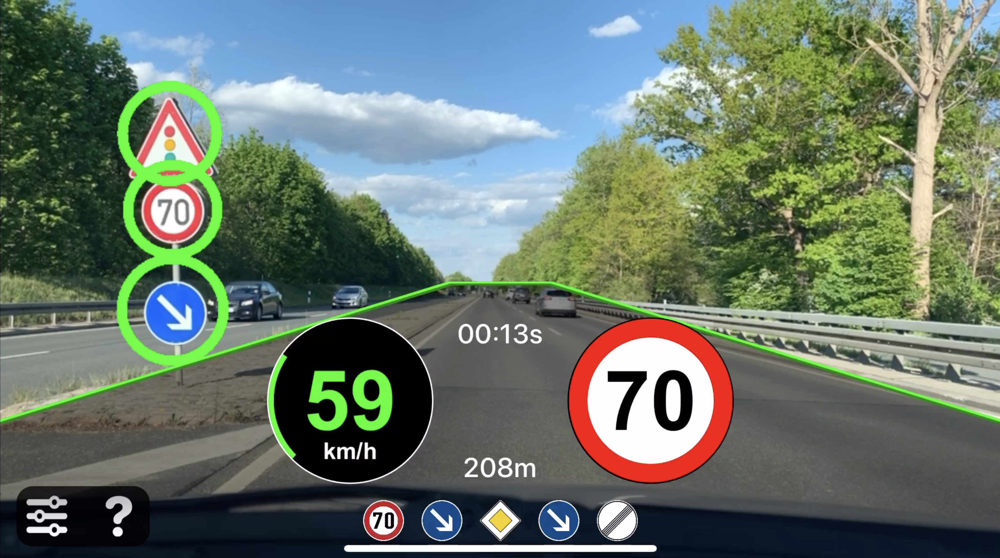

# Section 1:
## Problem Statement
### 'Traffic Sign Recognition using Deep learning'

1. Traffic signs are one of the most important part for our road infrastructure.In this jungle of cars, without the traffic signs accident would become a daily event of our lives.

2. In the world of automation, all automatic vechiles need an system which can detect and understand the meaning of traffic signs, therefore goal of this project to identify the traffic signs correctly and comparing various optimizer's performances.


# Section 2:
## 2.1:Data Source:https://www.kaggle.com/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign

## 2.2: Data Description

1. The data-set contains Train and Test folder. Train folder has 43 different folders named from 0 to 42. Each folder contains images from the respective class.

2. There are 39,209 train images and 12,630 test images. All images are 3-channel RGB-images.

3. There are also Train.csv and Test.csv files which contains information about the train and test images.

4. All the images are distributed in 43 different classes.


# IMPORTING NECESSARY LIBRARIES

In [20]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam,SGD,RMSprop,Adagrad
from keras.layers import Conv2D, MaxPool2D, Dense, Dropout, Flatten,BatchNormalization
from PIL import Image
import warnings
import seaborn as sns
from zipfile import ZipFile
warnings.filterwarnings('ignore')
np.random.seed(0)
tf.random.set_seed(0)

In [21]:
#from google.colab import drive 
#drive.mount('/content/drive')

In [22]:
#with ZipFile('/content/drive/MyDrive/gtsrb.zip','r') as zipobj:
 # zipobj.extractall('drive/MyDrive/CDS1')

In [23]:
cwd = '/home/sysadm/gtsrb/'
os.listdir(cwd)

['Meta', 'Test.csv', 'Meta.csv', 'Train', 'Test', 'Train.csv']

In [24]:
meta = os.listdir(cwd+'Meta')
meta.remove('.~lock.ClassesInformation.ods#')
meta.remove('.~lock.ClassesInformationStrong.ods#')
meta

['25.png',
 '41.png',
 '7.png',
 '26.png',
 '22.png',
 '28.png',
 '30.png',
 '40.png',
 '18.png',
 '19.png',
 '3.png',
 '29.png',
 '21.png',
 '31.png',
 '17.png',
 '42.png',
 '32.png',
 '39.png',
 '6.png',
 '2.png',
 '24.png',
 '16.png',
 '0.png',
 '9.png',
 '38.png',
 '37.png',
 '15.png',
 '35.png',
 '27.png',
 '5.png',
 '20.png',
 '8.png',
 '10.png',
 '1.png',
 '14.png',
 '4.png',
 '36.png',
 '34.png',
 '12.png',
 '13.png',
 '23.png',
 '33.png',
 '11.png']

# Visualizing the Dataset

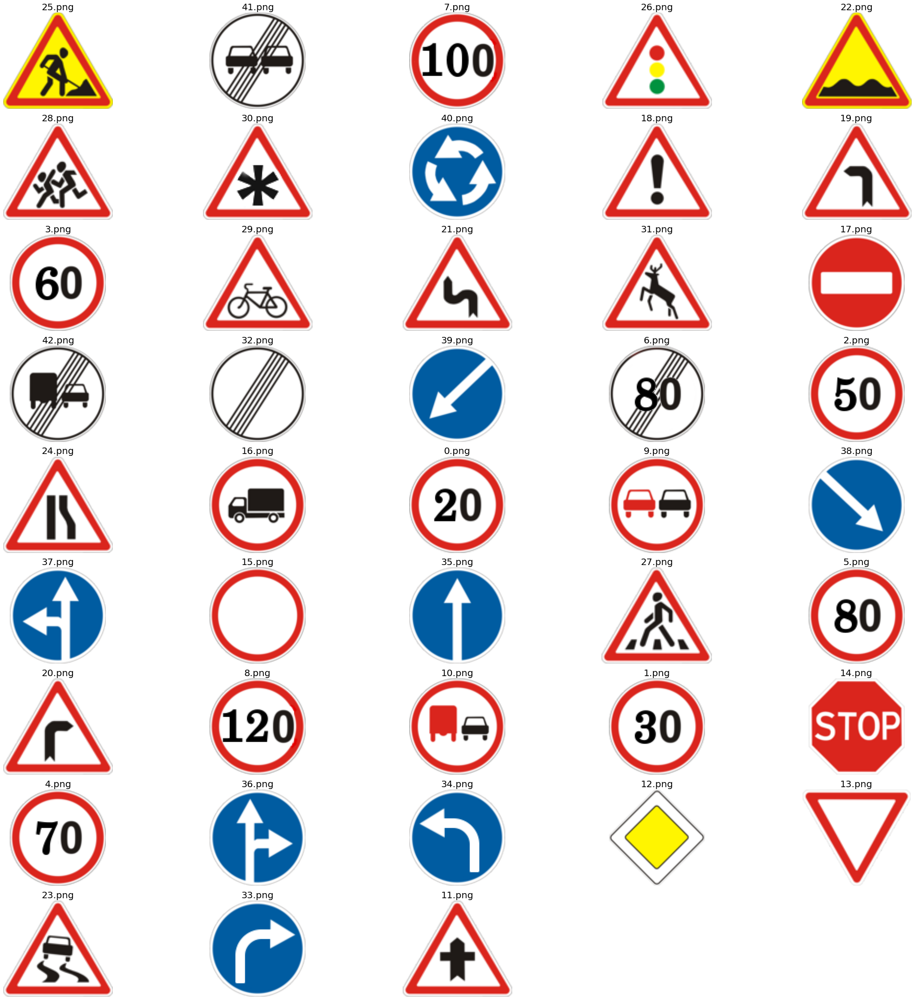

In [25]:
## Viewing images belonging to each class

plt.figure(figsize=(30,30))
for i, file in enumerate(meta):
    img = Image.open(cwd+'Meta/'+file)
    ax = plt.subplot(9,5,i+1)
    ax.imshow(img)
    ax.set_title(file, size=20)
    plt.axis('off')
plt.tight_layout()

In [26]:
## Creating a dictionary for class labels

classes = { 0:'Speed limit (20km/h)',
            1:'Speed limit (30km/h)', 
            2:'Speed limit (50km/h)', 
            3:'Speed limit (60km/h)', 
            4:'Speed limit (70km/h)', 
            5:'Speed limit (80km/h)', 
            6:'End of speed limit (80km/h)', 
            7:'Speed limit (100km/h)', 
            8:'Speed limit (120km/h)', 
            9:'No passing', 
            10:'No passing veh over 3.5 tons', 
            11:'Right-of-way at intersection', 
            12:'Priority road', 
            13:'Yield', 
            14:'Stop', 
            15:'No vehicles', 
            16:'Veh > 3.5 tons prohibited', 
            17:'No entry', 
            18:'General caution', 
            19:'Dangerous curve left', 
            20:'Dangerous curve right', 
            21:'Double curve', 
            22:'Bumpy road', 
            23:'Slippery road', 
            24:'Road narrows on the right', 
            25:'Road work', 
            26:'Traffic signals', 
            27:'Pedestrians', 
            28:'Children crossing', 
            29:'Bicycles crossing', 
            30:'Beware of ice/snow',
            31:'Wild animals crossing', 
            32:'End speed + passing limits', 
            33:'Turn right ahead', 
            34:'Turn left ahead', 
            35:'Ahead only', 
            36:'Go straight or right', 
            37:'Go straight or left', 
            38:'Keep right', 
            39:'Keep left', 
            40:'Roundabout mandatory', 
            41:'End of no passing', 
            42:'End no passing veh > 3.5 tons' }

In [27]:
train_df = pd.read_csv(cwd+'Train.csv')
train_df.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,27,26,5,5,22,20,20,Train/20/00020_00000_00000.png
1,28,27,5,6,23,22,20,Train/20/00020_00000_00001.png
2,29,26,6,5,24,21,20,Train/20/00020_00000_00002.png
3,28,27,5,6,23,22,20,Train/20/00020_00000_00003.png
4,28,26,5,5,23,21,20,Train/20/00020_00000_00004.png


**Train.csv file contains below information about each training image :**

1.Width : Width of image in number of pixels.

2.Height : Height of image in number of pixels.

3.Roi.X1 : Upper left X-coordinate of the bounding box.

4.Roi.Y1 : Upper left Y-coordinate of the bounding box.

5.Roi.X2 : Lower right X-coordinate of the bounding box.

6.Roi.Y2 : Lower right Y-coordinate of the bounding box.

7.ClassId : Class label of the image. It is an Integer between 0 and 43.

8.Path : Path where the image is present in the Train folder.

In [28]:
train_df.describe()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId
count,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000,39209.000000
mean,50.835880,50.328930,5.999515,5.962381,45.197302,44.728379,15.788390
std,24.306933,23.115423,1.475493,1.385440,23.060157,21.971145,12.013238
min,25.000000,25.000000,0.000000,5.000000,20.000000,20.000000,0.000000
25%,35.000000,35.000000,5.000000,5.000000,29.000000,30.000000,5.000000
50%,43.000000,43.000000,6.000000,6.000000,38.000000,38.000000,12.000000
75%,58.000000,58.000000,6.000000,6.000000,53.000000,52.000000,25.000000
max,243.000000,225.000000,20.000000,20.000000,223.000000,205.000000,42.000000


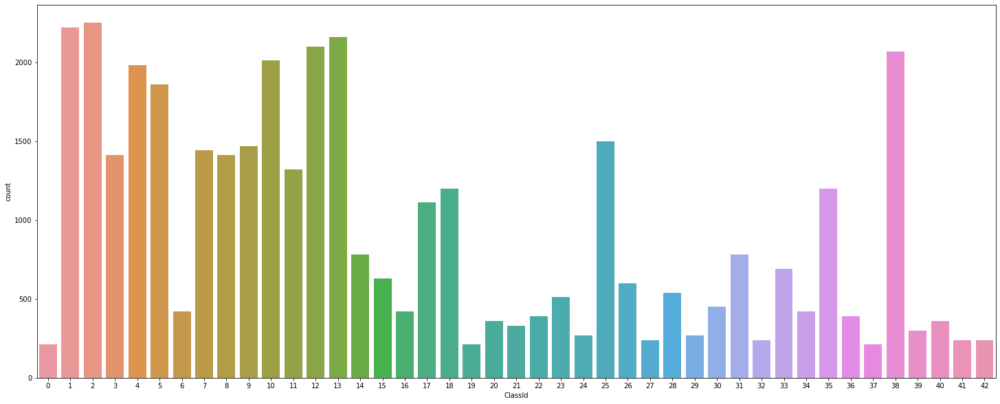

In [29]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches((25,10))
sns.countplot(data = train_df, x = 'ClassId', )
plt.show()


# 2.3 Observations
1.The target classes are clearly not uniformly distributed.

2.This is quite logical since some signs like "Keep speed below 30Kmph" or "A bump ahead" appears more often then signs like "Road under construction ahead".

3.Also, for most of the classes, the imbalance is not severe.

In [30]:
test_df = pd.read_csv(cwd+'Test.csv')
test_df.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,53,54,6,5,48,49,16,Test/00000.png
1,42,45,5,5,36,40,1,Test/00001.png
2,48,52,6,6,43,47,38,Test/00002.png
3,27,29,5,5,22,24,33,Test/00003.png
4,60,57,5,5,55,52,11,Test/00004.png


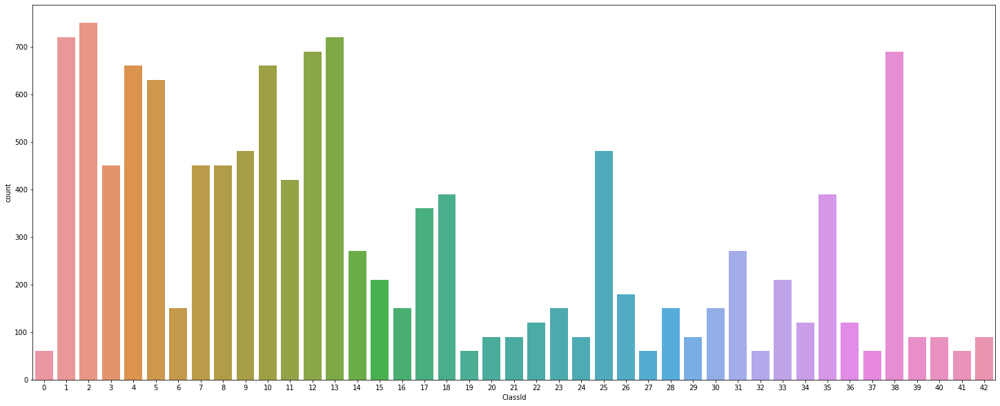

In [31]:
#Checking class distribution in test data
fig, ax = plt.subplots(1, 1)
fig.set_size_inches((25,10))
sns.countplot(data = test_df, x = 'ClassId', )
plt.show()


# 2.4 Observations
1.The observations for test data are quite similer to that of the train data.

2.Here also some classes are more frequent as compared to the others.

# Section 3
All the layers of a CNN have multiple convolutional filters working and scanning the complete feature matrix and carry out the dimensionality reduction. This enables CNN to be a very appropriate and fit network for image classifications and processing.CNN's are really effective for image classification as the concept of dimensionality reduction suits the huge number of parameters in an image.

# Section 4
## Preprocessing

In [32]:
print(f'minimum width: {train_df.Width.min()}')
print(f'minimum height: {train_df.Height.min()}')
print(f'average width: {train_df.Width.mean()}')
print(f'average height: {train_df.Height.mean()}')

minimum width: 25
minimum height: 25
average width: 50.83587951745773
average height: 50.328929582493814


In [33]:
train_x =[]
for i in train_df.Path:
    img = Image.open(cwd+i)       
    img = img.resize((30,30))     
    train_x.append(np.array(img)) 

train_y = np.array(train_df.ClassId)
train_x = np.array(train_x)
print(train_x.shape)
print(train_y.shape)

(39209, 30, 30, 3)
(39209,)


**Resized the train set's images with 30 by 30 and the colour format is RGB**

In [34]:
test_x =[]
for i in test_df.Path:
    img = Image.open(cwd+i)
    img = img.resize((30,30))
    test_x.append(np.array(img))

test_y = np.array(test_df.ClassId)
test_x = np.array(test_x)
print(test_x.shape)
print(test_y.shape)

(12630, 30, 30, 3)
(12630,)


**Resized the test set's images with 30 by 30 and the colour format is RGB**

Dangerous curve right


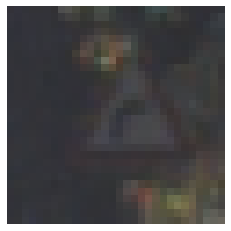

In [35]:
print(classes[train_y[2]])
plt.imshow(train_x[2])
plt.axis('off')
plt.show()

**1.Normalizing the train and test set's images**

**2.Converting train and test set's labels to one hot vector**

In [36]:
## Normalization

xtrain = train_x/255
xtest = test_x/255


# One Hot encoding

ytrain = keras.utils.to_categorical(train_y)
ytest = keras.utils.to_categorical(test_y)

**Here I split the train set in 70:30 format for training and validation**

In [37]:
from sklearn.model_selection import train_test_split
xtrain, xvalid, ytrain, yvalid = train_test_split(xtrain, ytrain, test_size=0.3, random_state=42)
print(xtrain.shape)
print(xvalid.shape)
print(ytrain.shape)
print(yvalid.shape)

(27446, 30, 30, 3)
(11763, 30, 30, 3)
(27446, 43)
(11763, 43)


**Converting to train,test, and validation set to tensor objects to simplyfy computational complexity**

In [38]:
xtrain=tf.convert_to_tensor(xtrain)
xvalid=tf.convert_to_tensor(xvalid)
xtest=tf.convert_to_tensor(xtest)
ytrain=tf.convert_to_tensor(ytrain)
yvalid=tf.convert_to_tensor(yvalid)
ytest=tf.convert_to_tensor(ytest)

# Section 5.
## Building The CNN Model

## CNN architechture

Typical CNN architectures stack a few convolutional layers (each one generally followed by a ReLU layer), then a pooling layer, then another few convolutional layers (+ReLU), then another pooling layer, and so on. The image gets smaller and smaller as it progresses through the network, but it also typically gets deeper and deeper (i.e., with more feature maps) thanks to the convolutional layers . At the top of the stack, a regular feedforward neural network is added, composed of a few fully connected layers (+ReLUs), and the final layer outputs the prediction (e.g., a softmax layer that outputs estimated class probabilities).

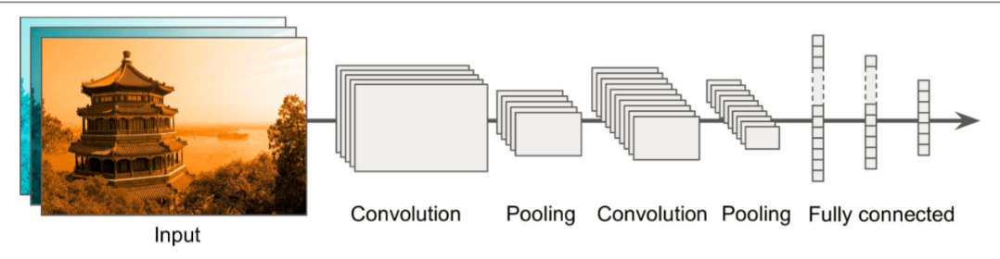

It’s common that, as we go deeper into the network, the sizes decrease, while the number of channels increases.

In [39]:
model1 = keras.models.Sequential()
model1.add(Conv2D(filters=8, kernel_size= (3,3), activation='relu', padding='same', input_shape=(30,30,3)))
model1.add(BatchNormalization())
model1.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model1.add(Dropout(0.25))
model1.add(Conv2D(filters=8, kernel_size=(3,3), activation='relu', padding='same'))
model1.add(BatchNormalization())
model1.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model1.add(Dropout(0.25))

model1.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
model1.add(BatchNormalization())
model1.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model1.add(Dropout(0.25))
model1.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
model1.add(BatchNormalization())
model1.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model1.add(Dropout(0.25))

model1.add(Flatten())
model1.add(Dense(100, activation='relu'))
model1.add(Dense(86, activation='relu'))
model1.add(Dropout(rate=0.5))
model1.add(Dense(43, activation='softmax'))

model1.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 8)         224       
                                                                 
 batch_normalization (BatchN  (None, 30, 30, 8)        32        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 15, 15, 8)        0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 15, 15, 8)         0         
                                                                 
 conv2d_1 (Conv2D)           (None, 15, 15, 8)         584       
                                                                 
 batch_normalization_1 (Batc  (None, 15, 15, 8)        3

## 5.1 For SGD OPTIMIZER

### Stochastic Gradient Descent

Basic idea:Initialize the parameters at some value $w_0 \in R^d$, and decrease the value of the empirical risk iteratively by sampling a random index $\tilde i_t$ uniformly from $\{1, \ldots, n\}$ and then updating

$w_{t+1} = w_t - \alpha_t \cdot \nabla L_{\tilde i_t}(w_t)$

where as usual $w_t$ is the value of the parameter vector at time $t$, $\alpha_t$ is the _learning rate_ or _step size_, and $\nabla f_i$ denotes the gradient of the loss function of the $i$th training example.

In [41]:
# Compiling the CNN model
model1.compile(optimizer=SGD(learning_rate=0.01),
             loss='categorical_crossentropy',
             metrics = ['accuracy'])

In [42]:

earlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights =False)

model_history1 = model1.fit(xtrain,ytrain, epochs=200,validation_data=(xvalid,yvalid),batch_size=1)

Epoch 1/200
27446/27446 [==============================] - 156s 6ms/step - loss: 2.5048 - accuracy: 0.2532 - val_loss: 2.2557 - val_accuracy: 0.2944
Epoch 2/200
27446/27446 [==============================] - 156s 6ms/step - loss: 1.9809 - accuracy: 0.3546 - val_loss: 2.1776 - val_accuracy: 0.3357
Epoch 3/200
27446/27446 [==============================] - 161s 6ms/step - loss: 1.8844 - accuracy: 0.3772 - val_loss: 2.0721 - val_accuracy: 0.3605
Epoch 4/200
27446/27446 [==============================] - 165s 6ms/step - loss: 1.8162 - accuracy: 0.3938 - val_loss: 2.1913 - val_accuracy: 0.3372
Epoch 5/200
27446/27446 [==============================] - 155s 6ms/step - loss: 1.7801 - accuracy: 0.4083 - val_loss: 2.1239 - val_accuracy: 0.3576
Epoch 6/200
27446/27446 [==============================] - 152s 6ms/step - loss: 1.7436 - accuracy: 0.4165 - val_loss: 1.9428 - val_accuracy: 0.3962
Epoch 7/200
27446/27446 [==============================] - 175s 6ms/step - loss: 1.7276 - accuracy: 0.4253

Epoch 56/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3254 - accuracy: 0.5733 - val_loss: 1.3556 - val_accuracy: 0.5937
Epoch 57/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3185 - accuracy: 0.5757 - val_loss: 1.3238 - val_accuracy: 0.6016
Epoch 58/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3081 - accuracy: 0.5767 - val_loss: 1.2852 - val_accuracy: 0.6079
Epoch 59/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3048 - accuracy: 0.5800 - val_loss: 1.4252 - val_accuracy: 0.6011
Epoch 60/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3059 - accuracy: 0.5765 - val_loss: 1.2800 - val_accuracy: 0.5960
Epoch 61/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3034 - accuracy: 0.5792 - val_loss: 1.2542 - val_accuracy: 0.5975
Epoch 62/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.3036 - accuracy: 0.5789

Epoch 111/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.2292 - accuracy: 0.6121 - val_loss: 1.1180 - val_accuracy: 0.6615
Epoch 112/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.2348 - accuracy: 0.6125 - val_loss: 1.1647 - val_accuracy: 0.6523
Epoch 113/200
27446/27446 [==============================] - 52s 2ms/step - loss: 1.2314 - accuracy: 0.6136 - val_loss: 1.0743 - val_accuracy: 0.6730
Epoch 114/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.2402 - accuracy: 0.6060 - val_loss: 1.2397 - val_accuracy: 0.6321
Epoch 115/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.2205 - accuracy: 0.6175 - val_loss: 1.2650 - val_accuracy: 0.6459
Epoch 116/200
27446/27446 [==============================] - 52s 2ms/step - loss: 1.2276 - accuracy: 0.6132 - val_loss: 1.2760 - val_accuracy: 0.6480
Epoch 117/200
27446/27446 [==============================] - 53s 2ms/step - loss: 1.2273 - accuracy:

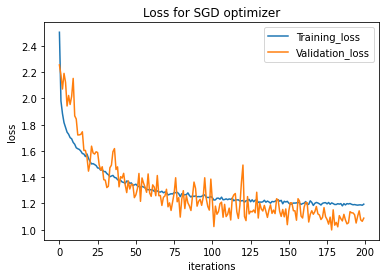

In [43]:
plt.plot(model_history1.history['loss'],label='Training_loss')
plt.plot(model_history1.history['val_loss'],label='Validation_loss')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('Loss for SGD optimizer')
plt.legend()
plt.savefig('SGD.png',facecolor='white')
plt.show()

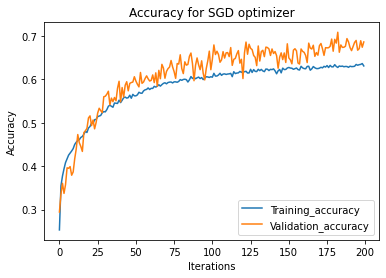

In [44]:
plt.plot(model_history1.history['accuracy'],label='Training_accuracy')
plt.plot(model_history1.history['val_accuracy'],label='Validation_accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy for SGD optimizer')
plt.legend()
plt.savefig('SGD_ACCUracy',facecolor='white')
plt.show()

In [46]:

loss1, accuracy1 = model1.evaluate(xtest,ytest)
print(f'Loss = {loss1:.2f}\naccuracy = {accuracy1*100:.2f}%')

395/395 [==============================] - 1s 3ms/step - loss: 1.2520 - accuracy: 0.6460
Loss = 1.25
accuracy = 64.60%


## 5.2 SGD WITH MINIBATCHING(Batch size=64)

### Minibatching!

One way to make SGD require fewer iterations is by decreasing the value of the gradient variance bound $\sigma^2$. A powerful way to do this is by using *minibatching*.

With minibatching, we use a sample of gradients of size larger than $1$. I.e.:

$$w_{t+1} = w_t - \alpha \cdot \frac{1}{B} \sum_{b=1}^B \nabla f_{i_{t,b}}(w_t) = w_t - \alpha \cdot \frac{1}{B} \sum_{b=1}^B \nabla_w \ell(w_t; x_{i_{t,b}}, y_{i_{t,b}}).$$

where $B$ is the *minibatch size* or *batch size*, and the $i_{t,b}$ are $b$ random variables drawn independently and uniformly from $\{1,\ldots,n\}$ (where $n$ is the size of the training set).

In [47]:
model2 = keras.models.Sequential()
model2.add(Conv2D(filters=8, kernel_size= (3,3), activation='relu', padding='same', input_shape=(30,30,3)))
model2.add(BatchNormalization())
model2.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model2.add(Dropout(0.25))
model2.add(Conv2D(filters=8, kernel_size=(3,3), activation='relu', padding='same'))
model2.add(BatchNormalization())
model2.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model2.add(Dropout(0.25))

model2.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
model2.add(BatchNormalization())
model2.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model2.add(Dropout(0.25))
model2.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
model2.add(BatchNormalization())
model2.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model2.add(Dropout(0.25))

model2.add(Flatten())
model2.add(Dense(100, activation='relu'))
model2.add(Dense(86, activation='relu'))
model2.add(Dropout(rate=0.5))
model2.add(Dense(43, activation='softmax'))

model2.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 30, 30, 8)         224       
                                                                 
 batch_normalization_4 (Batc  (None, 30, 30, 8)        32        
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 15, 15, 8)        0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 15, 15, 8)         0         
                                                                 
 conv2d_5 (Conv2D)           (None, 15, 15, 8)         584       
                                                                 
 batch_normalization_5 (Batc  (None, 15, 15, 8)       

In [48]:
# Compiling the CNN model
model2.compile(optimizer=SGD(learning_rate=0.01),
             loss='categorical_crossentropy',
             metrics = ['accuracy'])

In [49]:
earlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights =True)

model_history2 = model2.fit(xtrain,ytrain, epochs=200,
                         validation_data=(xvalid,yvalid),batch_size=64)

Epoch 1/200
429/429 [==============================] - 7s 15ms/step - loss: 3.6778 - accuracy: 0.0596 - val_loss: 3.5316 - val_accuracy: 0.1081
Epoch 2/200
429/429 [==============================] - 6s 15ms/step - loss: 3.4699 - accuracy: 0.0959 - val_loss: 3.2993 - val_accuracy: 0.1583
Epoch 3/200
429/429 [==============================] - 6s 14ms/step - loss: 3.3211 - accuracy: 0.1274 - val_loss: 3.0768 - val_accuracy: 0.1852
Epoch 4/200
429/429 [==============================] - 6s 14ms/step - loss: 3.1519 - accuracy: 0.1519 - val_loss: 2.8779 - val_accuracy: 0.2062
Epoch 5/200
429/429 [==============================] - 6s 14ms/step - loss: 2.9739 - accuracy: 0.1802 - val_loss: 2.6577 - val_accuracy: 0.2531
Epoch 6/200
429/429 [==============================] - 6s 14ms/step - loss: 2.7925 - accuracy: 0.2124 - val_loss: 2.4038 - val_accuracy: 0.2794
Epoch 7/200
429/429 [==============================] - 6s 14ms/step - loss: 2.6218 - accuracy: 0.2410 - val_loss: 2.2881 - val_accuracy:

429/429 [==============================] - 6s 14ms/step - loss: 1.0789 - accuracy: 0.6434 - val_loss: 0.5513 - val_accuracy: 0.8241
Epoch 114/200
429/429 [==============================] - 6s 14ms/step - loss: 1.0892 - accuracy: 0.6391 - val_loss: 0.5465 - val_accuracy: 0.8296
Epoch 115/200
429/429 [==============================] - 6s 14ms/step - loss: 1.0901 - accuracy: 0.6369 - val_loss: 0.5643 - val_accuracy: 0.8106
Epoch 116/200
429/429 [==============================] - 6s 14ms/step - loss: 1.0865 - accuracy: 0.6383 - val_loss: 0.6374 - val_accuracy: 0.7881
Epoch 117/200
429/429 [==============================] - 6s 14ms/step - loss: 1.0856 - accuracy: 0.6373 - val_loss: 0.5608 - val_accuracy: 0.8184
Epoch 118/200
429/429 [==============================] - 6s 14ms/step - loss: 1.0704 - accuracy: 0.6413 - val_loss: 0.5547 - val_accuracy: 0.8205
Epoch 119/200
429/429 [==============================] - 6s 14ms/step - loss: 1.0791 - accuracy: 0.6433 - val_loss: 0.5573 - val_accuracy:

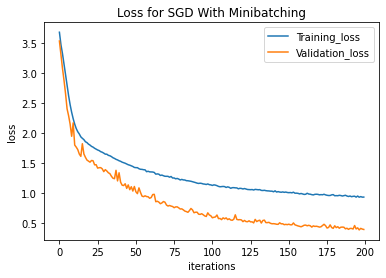

In [50]:
plt.plot(model_history2.history['loss'],label='Training_loss')
plt.plot(model_history2.history['val_loss'],label='Validation_loss')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('Loss for SGD With Minibatching')
plt.legend()
plt.savefig('SGD_mini',facecolor='white')
plt.show()

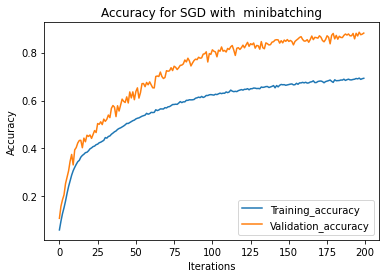

In [51]:
plt.plot(model_history2.history['accuracy'],label='Training_accuracy')
plt.plot(model_history2.history['val_accuracy'],label='Validation_accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy for SGD with  minibatching')
plt.legend()
plt.savefig('SGD_miniaccu',facecolor='white')
plt.show()

In [52]:

loss2, accuracy2 = model2.evaluate(xtest,ytest)
print(f'Loss = {loss2:.2f}\naccuracy = {accuracy2*100:.2f}%')

395/395 [==============================] - 1s 3ms/step - loss: 0.5042 - accuracy: 0.8294
Loss = 0.50
accuracy = 82.94%


## 5.3 FOR SGD WITH MOMENTUM

### Using Momentum With SGD


Usually we run something like this:

\begin{align*}
  v_{t+1} &= \beta v_t - \alpha \nabla L_{\tilde i_t}(w_t) \\
  w_{t+1} &= w_t + v_{t+1}.
  \\Here\quad \beta\quad is\quad momentum\quad parameter
\end{align*}



In [53]:
model3 = keras.models.Sequential()
model3.add(Conv2D(filters=8, kernel_size= (3,3), activation='relu', padding='same', input_shape=(30,30,3)))
model3.add(BatchNormalization())
model3.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model3.add(Dropout(0.25))
model3.add(Conv2D(filters=8, kernel_size=(3,3), activation='relu', padding='same'))
model3.add(BatchNormalization())
model3.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model3.add(Dropout(0.25))

model3.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
model3.add(BatchNormalization())
model3.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model3.add(Dropout(0.25))
model3.add(Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'))
model3.add(BatchNormalization())
model3.add(MaxPool2D((2,2),strides = (2,2), padding = "same"))
model3.add(Dropout(0.25))

model3.add(Flatten())
model3.add(Dense(100, activation='relu'))
model3.add(Dense(86, activation='relu'))
model3.add(Dropout(rate=0.5))
model3.add(Dense(43, activation='softmax'))

model3.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 30, 30, 8)         224       
                                                                 
 batch_normalization_8 (Batc  (None, 30, 30, 8)        32        
 hNormalization)                                                 
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 15, 15, 8)        0         
 2D)                                                             
                                                                 
 dropout_10 (Dropout)        (None, 15, 15, 8)         0         
                                                                 
 conv2d_9 (Conv2D)           (None, 15, 15, 8)         584       
                                                                 
 batch_normalization_9 (Batc  (None, 15, 15, 8)       

In [54]:
# Compiling the CNN model
model3.compile(optimizer=SGD(learning_rate=0.01,momentum=0.9,nesterov=True),
             loss='categorical_crossentropy',
             metrics = ['accuracy'])

In [55]:
arlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights =True)

model_history3 = model3.fit(xtrain,ytrain, epochs=200,validation_data=(xvalid,yvalid))

Epoch 1/200
858/858 [==============================] - 9s 9ms/step - loss: 3.1517 - accuracy: 0.1428 - val_loss: 2.2190 - val_accuracy: 0.2769
Epoch 2/200
858/858 [==============================] - 8s 9ms/step - loss: 2.2307 - accuracy: 0.3020 - val_loss: 1.8546 - val_accuracy: 0.3531
Epoch 3/200
858/858 [==============================] - 8s 9ms/step - loss: 2.0122 - accuracy: 0.3406 - val_loss: 1.7076 - val_accuracy: 0.3967
Epoch 4/200
858/858 [==============================] - 8s 9ms/step - loss: 1.9216 - accuracy: 0.3622 - val_loss: 1.6269 - val_accuracy: 0.4277
Epoch 5/200
858/858 [==============================] - 8s 9ms/step - loss: 1.8554 - accuracy: 0.3795 - val_loss: 1.5451 - val_accuracy: 0.4496
Epoch 6/200
858/858 [==============================] - 8s 9ms/step - loss: 1.8035 - accuracy: 0.4015 - val_loss: 1.4798 - val_accuracy: 0.4811
Epoch 7/200
858/858 [==============================] - 8s 9ms/step - loss: 1.7540 - accuracy: 0.4196 - val_loss: 1.3265 - val_accuracy: 0.5403

Epoch 58/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0976 - accuracy: 0.6446 - val_loss: 0.5343 - val_accuracy: 0.8262
Epoch 59/200
858/858 [==============================] - 8s 9ms/step - loss: 1.1003 - accuracy: 0.6425 - val_loss: 0.6086 - val_accuracy: 0.8031
Epoch 60/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0938 - accuracy: 0.6439 - val_loss: 0.5409 - val_accuracy: 0.8224
Epoch 61/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0865 - accuracy: 0.6446 - val_loss: 0.5412 - val_accuracy: 0.8217
Epoch 62/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0890 - accuracy: 0.6455 - val_loss: 0.5389 - val_accuracy: 0.8152
Epoch 63/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0874 - accuracy: 0.6483 - val_loss: 0.5367 - val_accuracy: 0.8191
Epoch 64/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0924 - accuracy: 0.6483 - val_loss: 0.5403 - val_accuracy:

Epoch 115/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0215 - accuracy: 0.6722 - val_loss: 0.5543 - val_accuracy: 0.8185
Epoch 116/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0138 - accuracy: 0.6747 - val_loss: 0.4415 - val_accuracy: 0.8561
Epoch 117/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0246 - accuracy: 0.6748 - val_loss: 0.4650 - val_accuracy: 0.8528
Epoch 118/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0203 - accuracy: 0.6713 - val_loss: 0.4398 - val_accuracy: 0.8530
Epoch 119/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0188 - accuracy: 0.6730 - val_loss: 0.4525 - val_accuracy: 0.8495
Epoch 120/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0270 - accuracy: 0.6713 - val_loss: 0.4342 - val_accuracy: 0.8600
Epoch 121/200
858/858 [==============================] - 8s 9ms/step - loss: 1.0238 - accuracy: 0.6742 - val_loss: 0.4556 - val_ac

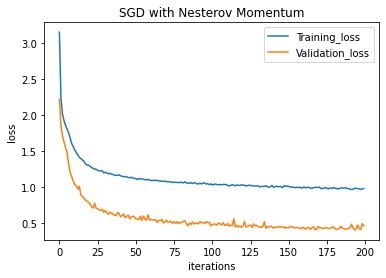

In [56]:
plt.plot(model_history3.history['loss'],label='Training_loss')
plt.plot(model_history3.history['val_loss'],label='Validation_loss')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('SGD with Nesterov Momentum')
plt.legend()
plt.savefig('sgdloss_nes.png',facecolor='white')
plt.show()

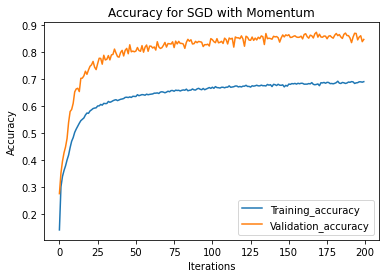

In [57]:
plt.plot(model_history3.history['accuracy'],label='Training_accuracy')
plt.plot(model_history3.history['val_accuracy'],label='Validation_accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy for SGD with Momentum')
plt.legend()
plt.savefig('sgdaccu.png',facecolor='white')
plt.show()

In [58]:
loss3, accuracy3 = model3.evaluate(xtest,ytest)
print(f'Loss = {loss3:.2f}\naccuracy = {accuracy3*100:.2f}%')

395/395 [==============================] - 1s 3ms/step - loss: 0.6784 - accuracy: 0.7780
Loss = 0.68
accuracy = 77.80%


## 5.4 For RMS_Prop Optimizer

**Algorithm RMSProp**

*Input:* global learning rate factor $\alpha$, decay rate $\rho$, initial parameters $w \in R^d$.

* Initialize $r \leftarrow 0 \in R^d$

* **loop**
  * select a minibatch $\mathcal{B}$ of size $B$
  * compute the stochastic gradient $g \leftarrow \frac{1}{B} \sum_{i \in \mathcal{B}} \nabla f_i(w)$
  * accumulate second moment estimate $r_j \leftarrow \rho r_j + (1 - \rho) g_j^2$ for all $j \in \{1, \ldots, d \}$
  * update model $w_j \rightarrow w_j - \frac{\alpha}{\sqrt{r_j}} \cdot g_j$ for all $j \in \{1, \ldots, d \}$

In [59]:
model4 = keras.models.Sequential()
model4.add(Conv2D(filters=64, kernel_size= (3,3), strides=2, activation='relu', padding='same', input_shape=(30,30,3)))
model4.add(BatchNormalization())
model4.add(MaxPool2D((2,2), padding='same'))
model4.add(Dropout(0.2))

model4.add(Conv2D(filters=32, kernel_size=(3,3), strides=2, activation='relu', padding='same'))
model4.add(BatchNormalization())
model4.add(MaxPool2D((2,2), padding='same'))
model4.add(Dropout(0.2))


model4.add(Conv2D(filters=16, kernel_size=(3,3), strides=2, activation='relu', padding='same'))
model4.add(BatchNormalization())
model4.add(MaxPool2D((2,2), padding='same'))
model4.add(Dropout(0.2))

model4.add(Flatten())
model4.add(Dense(300, activation='relu'))
model4.add(Dense(200, activation='relu'))
model4.add(Dense(43, activation='softmax'))

model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 15, 15, 64)        1792      
                                                                 
 batch_normalization_12 (Bat  (None, 15, 15, 64)       256       
 chNormalization)                                                
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 dropout_15 (Dropout)        (None, 8, 8, 64)          0         
                                                                 
 conv2d_13 (Conv2D)          (None, 4, 4, 32)          18464     
                                                                 
 batch_normalization_13 (Bat  (None, 4, 4, 32)        

In [60]:
model4.compile(optimizer=RMSprop(learning_rate=0.001),
             loss='categorical_crossentropy',
             metrics = ['accuracy'])

In [61]:
earlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights =True)

model_history4 = model4.fit(xtrain,ytrain, epochs=200,validation_data=(xvalid,yvalid))

Epoch 1/200
858/858 [==============================] - 9s 8ms/step - loss: 2.2138 - accuracy: 0.3259 - val_loss: 1.4500 - val_accuracy: 0.5167
Epoch 2/200
858/858 [==============================] - 7s 8ms/step - loss: 1.4209 - accuracy: 0.5325 - val_loss: 0.9257 - val_accuracy: 0.6843
Epoch 3/200
858/858 [==============================] - 7s 8ms/step - loss: 1.1099 - accuracy: 0.6304 - val_loss: 0.6743 - val_accuracy: 0.7734
Epoch 4/200
858/858 [==============================] - 7s 8ms/step - loss: 0.9774 - accuracy: 0.6781 - val_loss: 0.5473 - val_accuracy: 0.8144
Epoch 5/200
858/858 [==============================] - 7s 8ms/step - loss: 0.8877 - accuracy: 0.7114 - val_loss: 0.5921 - val_accuracy: 0.8181
Epoch 6/200
858/858 [==============================] - 7s 8ms/step - loss: 0.8265 - accuracy: 0.7298 - val_loss: 0.4303 - val_accuracy: 0.8704
Epoch 7/200
858/858 [==============================] - 7s 8ms/step - loss: 0.7850 - accuracy: 0.7459 - val_loss: 0.4193 - val_accuracy: 0.8645

Epoch 58/200
858/858 [==============================] - 7s 8ms/step - loss: 0.4879 - accuracy: 0.8500 - val_loss: 0.2124 - val_accuracy: 0.9403
Epoch 59/200
858/858 [==============================] - 7s 8ms/step - loss: 0.4937 - accuracy: 0.8489 - val_loss: 0.2267 - val_accuracy: 0.9396
Epoch 60/200
858/858 [==============================] - 7s 8ms/step - loss: 0.4863 - accuracy: 0.8511 - val_loss: 0.2074 - val_accuracy: 0.9381
Epoch 61/200
858/858 [==============================] - 7s 8ms/step - loss: 0.4941 - accuracy: 0.8478 - val_loss: 0.2209 - val_accuracy: 0.9290
Epoch 62/200
858/858 [==============================] - 7s 8ms/step - loss: 0.4899 - accuracy: 0.8484 - val_loss: 0.1987 - val_accuracy: 0.9447
Epoch 63/200
858/858 [==============================] - 7s 8ms/step - loss: 0.4987 - accuracy: 0.8473 - val_loss: 0.1759 - val_accuracy: 0.9505
Epoch 64/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5028 - accuracy: 0.8490 - val_loss: 0.2128 - val_accuracy:

Epoch 115/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5090 - accuracy: 0.8513 - val_loss: 0.2241 - val_accuracy: 0.9349
Epoch 116/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5137 - accuracy: 0.8478 - val_loss: 0.1639 - val_accuracy: 0.9539
Epoch 117/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5064 - accuracy: 0.8498 - val_loss: 0.1645 - val_accuracy: 0.9603
Epoch 118/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5109 - accuracy: 0.8500 - val_loss: 0.1647 - val_accuracy: 0.9485
Epoch 119/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5145 - accuracy: 0.8485 - val_loss: 0.1954 - val_accuracy: 0.9447
Epoch 120/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5038 - accuracy: 0.8503 - val_loss: 0.2024 - val_accuracy: 0.9474
Epoch 121/200
858/858 [==============================] - 7s 8ms/step - loss: 0.5114 - accuracy: 0.8504 - val_loss: 0.2016 - val_ac

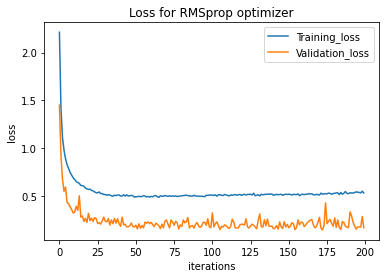

In [62]:
plt.plot(model_history4.history['loss'],label='Training_loss')
plt.plot(model_history4.history['val_loss'],label='Validation_loss')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('Loss for RMSprop optimizer')
plt.legend()
plt.savefig('rmsprop_loss.png',facecolor='white')
plt.show()

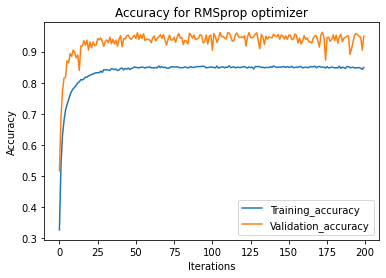

In [63]:
plt.plot(model_history4.history['accuracy'],label='Training_accuracy')
plt.plot(model_history4.history['val_accuracy'],label='Validation_accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy for RMSprop optimizer')
plt.legend()
plt.savefig('rms_accu.png',facecolor='white')
plt.show()

In [64]:
loss4, accuracy4 = model4.evaluate(xtest,ytest)
print(f'Loss = {loss4:.2f}\naccuracy = {accuracy4*100:.2f}%')

395/395 [==============================] - 1s 2ms/step - loss: 0.3805 - accuracy: 0.8909
Loss = 0.38
accuracy = 89.09%


## 5.5 For Adagrad Optimizer

**Algorithm AdaGrad**

*Input:* global learning rate factor $\alpha$, initial parameters $w \in R^d$.

* Initialize $r \leftarrow 0 \in R^d$

* **loop**
  * select a minibatch $\mathcal{B}$ of size $B$
  * compute the stochastic gradient $g \leftarrow \frac{1}{B} \sum_{i \in \mathcal{B}} \nabla f_i(w)$
  * accumulate second moment estimate $r_j \leftarrow r_j + g_j^2$ for all $j \in \{1, \ldots, d \}$
  * update model $w_j \leftarrow w_j - \frac{\alpha}{\sqrt{r_j}} \cdot g_j$ for all $j \in \{1, \ldots, d \}$


In [65]:
model5 = keras.models.Sequential()
model5.add(Conv2D(filters=64, kernel_size= (3,3), strides=2, activation='relu', padding='same', input_shape=(30,30,3)))
model5.add(BatchNormalization())
model5.add(MaxPool2D((2,2), padding='same'))
model5.add(Dropout(0.2))

model5.add(Conv2D(filters=32, kernel_size=(3,3), strides=2, activation='relu', padding='same'))
model5.add(BatchNormalization())
model5.add(MaxPool2D((2,2), padding='same'))
model5.add(Dropout(0.2))


model5.add(Conv2D(filters=16, kernel_size=(3,3), strides=2, activation='relu', padding='same'))
model5.add(BatchNormalization())
model5.add(MaxPool2D((2,2), padding='same'))
model5.add(Dropout(0.2))

model5.add(Flatten())
model5.add(Dense(300, activation='relu'))
model5.add(Dense(200, activation='relu'))
model5.add(Dense(43, activation='softmax'))

model5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 15, 15, 64)        1792      
                                                                 
 batch_normalization_15 (Bat  (None, 15, 15, 64)       256       
 chNormalization)                                                
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 dropout_18 (Dropout)        (None, 8, 8, 64)          0         
                                                                 
 conv2d_16 (Conv2D)          (None, 4, 4, 32)          18464     
                                                                 
 batch_normalization_16 (Bat  (None, 4, 4, 32)        

In [66]:
model5.compile(optimizer=Adagrad(learning_rate=0.001),
             loss='categorical_crossentropy',
             metrics = ['accuracy'])

In [67]:
earlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights =True)

model_history5= model5.fit(xtrain,ytrain, epochs=200,validation_data=(xvalid,yvalid))

Epoch 1/200
858/858 [==============================] - 7s 8ms/step - loss: 3.6388 - accuracy: 0.0646 - val_loss: 3.5280 - val_accuracy: 0.1030
Epoch 2/200
858/858 [==============================] - 6s 8ms/step - loss: 3.4304 - accuracy: 0.1042 - val_loss: 3.3275 - val_accuracy: 0.1266
Epoch 3/200
858/858 [==============================] - 6s 8ms/step - loss: 3.2847 - accuracy: 0.1264 - val_loss: 3.1674 - val_accuracy: 0.1509
Epoch 4/200
858/858 [==============================] - 6s 7ms/step - loss: 3.1579 - accuracy: 0.1491 - val_loss: 3.0228 - val_accuracy: 0.1763
Epoch 5/200
858/858 [==============================] - 6s 8ms/step - loss: 3.0367 - accuracy: 0.1720 - val_loss: 2.8866 - val_accuracy: 0.2090
Epoch 6/200
858/858 [==============================] - 6s 7ms/step - loss: 2.9300 - accuracy: 0.1920 - val_loss: 2.7515 - val_accuracy: 0.2410
Epoch 7/200
858/858 [==============================] - 6s 7ms/step - loss: 2.8281 - accuracy: 0.2167 - val_loss: 2.6327 - val_accuracy: 0.2740

Epoch 58/200
858/858 [==============================] - 6s 7ms/step - loss: 1.5806 - accuracy: 0.4939 - val_loss: 1.2548 - val_accuracy: 0.6023
Epoch 59/200
858/858 [==============================] - 6s 7ms/step - loss: 1.5692 - accuracy: 0.4927 - val_loss: 1.2499 - val_accuracy: 0.6041
Epoch 60/200
858/858 [==============================] - 6s 7ms/step - loss: 1.5643 - accuracy: 0.4943 - val_loss: 1.2397 - val_accuracy: 0.6086
Epoch 61/200
858/858 [==============================] - 6s 8ms/step - loss: 1.5592 - accuracy: 0.4956 - val_loss: 1.2316 - val_accuracy: 0.6108
Epoch 62/200
858/858 [==============================] - 6s 8ms/step - loss: 1.5528 - accuracy: 0.4972 - val_loss: 1.2204 - val_accuracy: 0.6141
Epoch 63/200
858/858 [==============================] - 6s 8ms/step - loss: 1.5415 - accuracy: 0.5018 - val_loss: 1.2135 - val_accuracy: 0.6174
Epoch 64/200
858/858 [==============================] - 6s 7ms/step - loss: 1.5494 - accuracy: 0.4995 - val_loss: 1.2057 - val_accuracy:

Epoch 115/200
858/858 [==============================] - 6s 7ms/step - loss: 1.3084 - accuracy: 0.5685 - val_loss: 0.9345 - val_accuracy: 0.7036
Epoch 116/200
858/858 [==============================] - 6s 7ms/step - loss: 1.3098 - accuracy: 0.5692 - val_loss: 0.9278 - val_accuracy: 0.7071
Epoch 117/200
858/858 [==============================] - 6s 8ms/step - loss: 1.2966 - accuracy: 0.5705 - val_loss: 0.9266 - val_accuracy: 0.7070
Epoch 118/200
858/858 [==============================] - 6s 7ms/step - loss: 1.2986 - accuracy: 0.5729 - val_loss: 0.9302 - val_accuracy: 0.7060
Epoch 119/200
858/858 [==============================] - 6s 8ms/step - loss: 1.2939 - accuracy: 0.5753 - val_loss: 0.9214 - val_accuracy: 0.7090
Epoch 120/200
858/858 [==============================] - 6s 7ms/step - loss: 1.2854 - accuracy: 0.5742 - val_loss: 0.9162 - val_accuracy: 0.7093
Epoch 121/200
858/858 [==============================] - 6s 7ms/step - loss: 1.2885 - accuracy: 0.5775 - val_loss: 0.9134 - val_ac

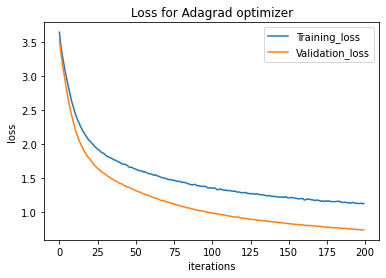

In [68]:
plt.plot(model_history5.history['loss'],label='Training_loss')
plt.plot(model_history5.history['val_loss'],label='Validation_loss')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('Loss for Adagrad optimizer')
plt.legend()
plt.savefig('loss_adagrad.png',facecolor='white')
plt.show()

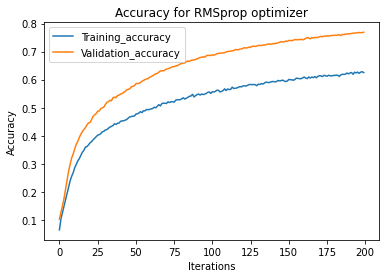

In [69]:
plt.plot(model_history5.history['accuracy'],label='Training_accuracy')
plt.plot(model_history5.history['val_accuracy'],label='Validation_accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy for RMSprop optimizer')
plt.legend()
plt.savefig('rmsprop_accu.png',facecolor='white')
plt.show()

In [70]:
loss5, accuracy5 = model5.evaluate(xtest,ytest)
print(f'Loss = {loss5:.2f}\naccuracy = {accuracy5*100:.2f}%')

395/395 [==============================] - 1s 2ms/step - loss: 0.9127 - accuracy: 0.6991
Loss = 0.91
accuracy = 69.91%


## 5.6 For Adam Optimizer

**Algorithm Adam**

*Input:* global learning rate factor $\alpha$, decay rates $\rho_1$ and $\rho_2$, initial parameters $w \in R^d$.

* Initialize $r \leftarrow 0 \in R^d$
* Initialize timestep $t \leftarrow 0$

* **loop**
  * update timestep $t \leftarrow t + 1$
  * select a minibatch $\mathcal{B}$ of size $B$
  * compute the stochastic gradient $g \leftarrow \frac{1}{B} \sum_{i \in \mathcal{B}} \nabla f_i(w)$
  * accumulate first moment estimate $s_j \leftarrow \rho_1 s_j + (1 - \rho_1) g_j$ for all $j \in \{1, \ldots, d \}$
  * accumulate second moment estimate $r_j \leftarrow \rho_2 r_j + (1 - \rho_2) g_j^2$ for all $j \in \{1, \ldots, d \}$
  * correct first moment bias $\hat s \leftarrow \frac{s}{1 - \rho_1^t}$ 
  * correct second moment bias $\hat r \leftarrow \frac{r}{1 - \rho_2^t}$
  * update model $w_j \rightarrow w_j - \frac{\alpha}{\sqrt{\hat r_j}} \cdot \hat s_j$ for all $j \in \{1, \ldots, d \}$

**Adam** is Modified RMSProp to  use momentum with exponential weighting, and correct for bias to
estimate the first-order and second-order moments of the gradients

In [71]:
model6 = keras.models.Sequential()
model6.add(Conv2D(filters=64, kernel_size= (3,3), strides=2, activation='relu', padding='same', input_shape=(30,30,3)))
model6.add(BatchNormalization())
model6.add(MaxPool2D((2,2), padding='same'))
model6.add(Dropout(0.2))

model6.add(Conv2D(filters=32, kernel_size=(3,3), strides=2, activation='relu', padding='same'))
model6.add(BatchNormalization())
model6.add(MaxPool2D((2,2), padding='same'))
model6.add(Dropout(0.2))


model6.add(Conv2D(filters=16, kernel_size=(3,3), strides=2, activation='relu', padding='same'))
model6.add(BatchNormalization())
model6.add(MaxPool2D((2,2), padding='same'))
model6.add(Dropout(0.2))

model6.add(Flatten())
model6.add(Dense(300, activation='relu'))
model6.add(Dense(200, activation='relu'))
model6.add(Dense(43, activation='softmax'))

model6.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 15, 15, 64)        1792      
                                                                 
 batch_normalization_18 (Bat  (None, 15, 15, 64)       256       
 chNormalization)                                                
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 8, 8, 64)         0         
 g2D)                                                            
                                                                 
 dropout_21 (Dropout)        (None, 8, 8, 64)          0         
                                                                 
 conv2d_19 (Conv2D)          (None, 4, 4, 32)          18464     
                                                                 
 batch_normalization_19 (Bat  (None, 4, 4, 32)        

In [72]:
model6.compile(optimizer=Adam(learning_rate=0.001),
             loss='categorical_crossentropy',
             metrics = ['accuracy'])

In [73]:
earlystop_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights =True)

model_history6 = model6.fit(xtrain,ytrain, epochs=200,validation_data=(xvalid,yvalid))

Epoch 1/200
858/858 [==============================] - 7s 8ms/step - loss: 2.1877 - accuracy: 0.3475 - val_loss: 1.2970 - val_accuracy: 0.5653
Epoch 2/200
858/858 [==============================] - 7s 8ms/step - loss: 1.3023 - accuracy: 0.5689 - val_loss: 0.8003 - val_accuracy: 0.7422
Epoch 3/200
858/858 [==============================] - 7s 8ms/step - loss: 1.0565 - accuracy: 0.6464 - val_loss: 0.6087 - val_accuracy: 0.7806
Epoch 4/200
858/858 [==============================] - 7s 8ms/step - loss: 0.9304 - accuracy: 0.6887 - val_loss: 0.5042 - val_accuracy: 0.8354
Epoch 5/200
858/858 [==============================] - 7s 8ms/step - loss: 0.8347 - accuracy: 0.7228 - val_loss: 0.4561 - val_accuracy: 0.8535
Epoch 6/200
858/858 [==============================] - 7s 8ms/step - loss: 0.7725 - accuracy: 0.7419 - val_loss: 0.3829 - val_accuracy: 0.8710
Epoch 7/200
858/858 [==============================] - 7s 8ms/step - loss: 0.7319 - accuracy: 0.7555 - val_loss: 0.3183 - val_accuracy: 0.8929

Epoch 58/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3878 - accuracy: 0.8724 - val_loss: 0.1327 - val_accuracy: 0.9623
Epoch 59/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3852 - accuracy: 0.8752 - val_loss: 0.1080 - val_accuracy: 0.9674
Epoch 60/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3799 - accuracy: 0.8759 - val_loss: 0.1298 - val_accuracy: 0.9620
Epoch 61/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3835 - accuracy: 0.8767 - val_loss: 0.1215 - val_accuracy: 0.9661
Epoch 62/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3813 - accuracy: 0.8764 - val_loss: 0.1338 - val_accuracy: 0.9589
Epoch 63/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3818 - accuracy: 0.8748 - val_loss: 0.1119 - val_accuracy: 0.9680
Epoch 64/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3786 - accuracy: 0.8777 - val_loss: 0.1551 - val_accuracy:

Epoch 115/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3371 - accuracy: 0.8893 - val_loss: 0.1058 - val_accuracy: 0.9691
Epoch 116/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3366 - accuracy: 0.8909 - val_loss: 0.0918 - val_accuracy: 0.9738
Epoch 117/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3302 - accuracy: 0.8924 - val_loss: 0.1070 - val_accuracy: 0.9682
Epoch 118/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3241 - accuracy: 0.8938 - val_loss: 0.1052 - val_accuracy: 0.9697
Epoch 119/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3390 - accuracy: 0.8917 - val_loss: 0.1030 - val_accuracy: 0.9708
Epoch 120/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3383 - accuracy: 0.8915 - val_loss: 0.1008 - val_accuracy: 0.9697
Epoch 121/200
858/858 [==============================] - 7s 8ms/step - loss: 0.3426 - accuracy: 0.8878 - val_loss: 0.1021 - val_ac

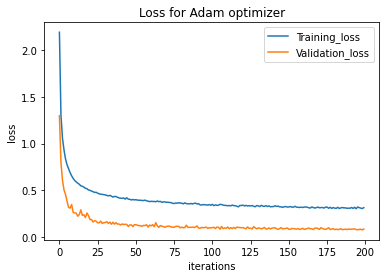

In [74]:
plt.plot(model_history6.history['loss'],label='Training_loss')
plt.plot(model_history6.history['val_loss'],label='Validation_loss')
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('Loss for Adam optimizer')
plt.legend()
plt.savefig('loss_adam.png',facecolor='white')
plt.show()

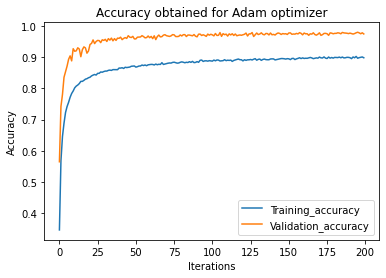

In [75]:
plt.plot(model_history6.history['accuracy'],label='Training_accuracy')
plt.plot(model_history6.history['val_accuracy'],label='Validation_accuracy')
plt.xlabel('Iterations')
plt.ylabel('Accuracy')
plt.title('Accuracy obtained for Adam optimizer')
plt.legend()
plt.savefig('adam_accu.png',facecolor='white')
plt.show()

In [76]:
loss6, accuracy6 = model6.evaluate(xtest,ytest)
print(f'Loss = {loss6:.2f}\naccuracy = {accuracy6*100:.2f}%')

395/395 [==============================] - 1s 2ms/step - loss: 0.2947 - accuracy: 0.9119
Loss = 0.29
accuracy = 91.19%


# Section 6
## 6.1-Comparison of the optimizers

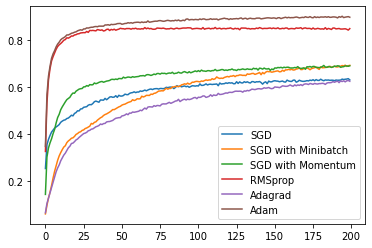

In [77]:
plt.plot(model_history1.history['accuracy'],label='SGD')
plt.plot(model_history2.history['accuracy'],label='SGD with Minibatch')
plt.plot(model_history3.history['accuracy'],label='SGD with Momentum')
plt.plot(model_history4.history['accuracy'],label='RMSprop')
plt.plot(model_history5.history['accuracy'],label='Adagrad')
plt.plot(model_history6.history['accuracy'],label='Adam')
plt.legend()
plt.savefig('ACCu_compa.png',facecolor='white')
plt.show()

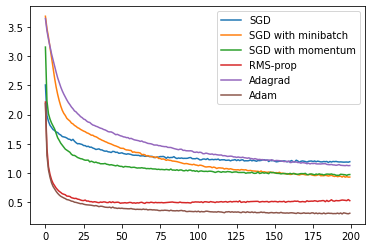

In [78]:
plt.plot(model_history1.history['loss'],label='SGD')
plt.plot(model_history2.history['loss'],label='SGD with minibatch')
plt.plot(model_history3.history['loss'],label='SGD with momentum')
plt.plot(model_history4.history['loss'],label='RMS-prop')
plt.plot(model_history5.history['loss'],label='Adagrad')
plt.plot(model_history6.history['loss'],label='Adam')
plt.legend()
plt.savefig('Losscompa.png',facecolor='white')
plt.show()

## 6.2 Observation
- From the plot it is clera Adam performs better than any other obtimizers.

- Then comes the RMSprop, as it uses exponentially moving average instead of sum.

- SGD with Nesterov momentum also performs bettter than rest of the obtimizers.

# Comparison of SGD variants

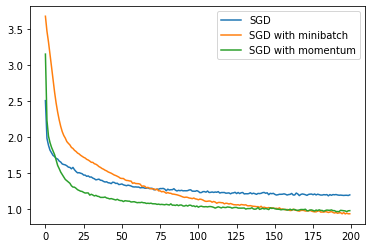

In [81]:
plt.plot(model_history1.history['loss'],label='SGD')
plt.plot(model_history2.history['loss'],label='SGD with minibatch')
plt.plot(model_history3.history['loss'],label='SGD with momentum')
plt.legend()
plt.savefig('Losscompasgd.png',facecolor='white')
plt.show()

## 6.3 Observation
- Among the SGD variants, SGD with momentum performs better though SGD with minibatching (batch size=64) is as good as momentum.
- From the SGD plot, we can infer that, for the plateau region the decreasing of loss is stopped after a certain epochs.

# Comparison of Adaptive learning rate optimizers

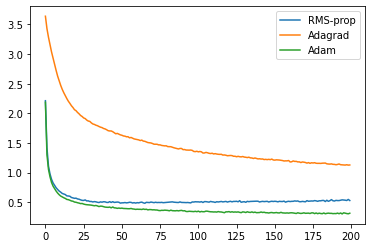

In [82]:
plt.plot(model_history4.history['loss'],label='RMS-prop')
plt.plot(model_history5.history['loss'],label='Adagrad')
plt.plot(model_history6.history['loss'],label='Adam')
plt.legend()
plt.savefig('Losscompa_adaptive.png',facecolor='white')
plt.show()

## 6.4 Observation
- From the plot it is clear that Adagrad performs worse than any other adaptive optimizers, as learning rate gets smaller through epochs it requires long training process.

- RMSpop and Adam almost perform equivalently , Adam reaches the optima quicker.

## 6.5 Accuracy Table

In [85]:
pd.DataFrame({'Optimizers':['SGD','SGD_MINIBATCH','SGD_MOMENTUM','RMS_PROP','ADAGRAD','ADAM'],'Accuracy':[accuracy1,accuracy2,accuracy3,accuracy4,accuracy5,accuracy6]})

,Optimizers,Accuracy
0,SGD,0.646002
1,SGD_MINIBATCH,0.829374
2,SGD_MOMENTUM,0.777989
3,RMS_PROP,0.890895
4,ADAGRAD,0.699129
5,ADAM,0.911876


# Making Predictions

In [79]:
prob = model6.predict(xtest)
pred = np.argmax(prob, axis=-1)

395/395 [==============================] - 1s 2ms/step


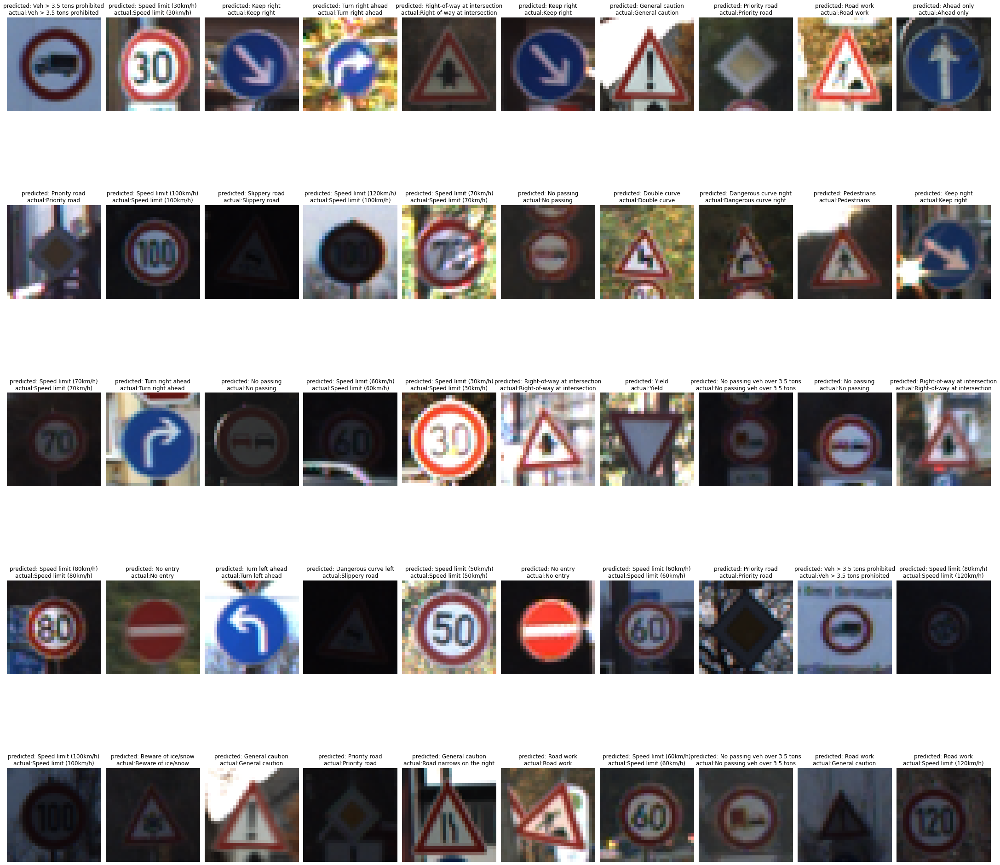

In [80]:
plt.figure(figsize=(30,30))
for i in range(50):
    ax = plt.subplot(5,10,i+1)
    ax.imshow(xtest[i])
    ax.set_title(f'predicted: {classes[pred[i]]}\nactual:{classes[test_y[i]]}')
    plt.axis('off')
plt.tight_layout()
plt.show()